## <b> <span style='color:#e61227'>|</span> Traffic Signs Detection Using YOLOv8 </b>

In [ ]:
from IPython.core.display import display, HTML, Javascript

color_map = ['#FFFFFF','#FF5733']

prompt = color_map[-1]
main_color = color_map[0]
strong_main_color = color_map[1]
custom_colors = [strong_main_color, main_color]

css_file = '''
div #notebook {
background-color: white;
line-height: 20px;
}

#notebook-container {
%s
margin-top: 2em;
padding-top: 2em;
border-top: 4px solid %s;
-webkit-box-shadow: 0px 0px 8px 2px rgba(224, 212, 226, 0.5);
    box-shadow: 0px 0px 8px 2px rgba(224, 212, 226, 0.5);
}

div .input {
margin-bottom: 1em;
}

.rendered_html h1, .rendered_html h2, .rendered_html h3, .rendered_html h4, .rendered_html h5, .rendered_html h6 {
color: %s;
font-weight: 600;
}

div.input_area {
border: none;
    background-color: %s;
    border-top: 2px solid %s;
}

div.input_prompt {
color: %s;
}

div.output_prompt {
color: %s;
}

div.cell.selected:before, div.cell.selected.jupyter-soft-selected:before {
background: %s;
}

div.cell.selected, div.cell.selected.jupyter-soft-selected {
    border-color: %s;
}

.edit_mode div.cell.selected:before {
background: %s;
}

.edit_mode div.cell.selected {
border-color: %s;

}
'''

def to_rgb(h):
    return tuple(int(h[i:i+2], 16) for i in [0, 2, 4])

main_color_rgba = 'rgba(%s, %s, %s, 0.1)' % (to_rgb(main_color[1:]))
open('notebook.css', 'w').write(css_file % ('width: 95%;', main_color, main_color, main_color_rgba,
                                            main_color,  main_color, prompt, main_color, main_color,
                                            main_color, main_color))

def nb():
    return HTML("<style>" + open("notebook.css", "r").read() + "</style>")
nb()


![](https://learnopencv.com/wp-content/uploads/2023/01/evolution-of-yolo-models-1024x576.png)

## <b>1 <span style='color:#e61227'>|</span> Introduction</b>

<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227''>1.1 |</span></b> Object Detection </b></p>
</div>

**Computer vision** is a field of artificial intelligence that focuses on teaching computers to interpret and understand visual information. One popular and powerful technique used in computer vision for object detection is called **YOLO**, which stands for "You Only Look Once".

YOLO aims to identify and locate objects in an image or video stream in real-time. Unlike traditional methods that rely on complex pipelines and multiple passes, YOLO takes a different approach by treating object detection as a single regression problem.

This algorithm divides the input image into a grid and predicts bounding boxes and class probabilities for objects within each grid cell. It simultaneously predicts the class labels and their corresponding bounding boxes, making it incredibly efficient and fast. YOLO is known for its real-time performance, enabling it to process images and videos at impressive speeds.

By leveraging **deep convolutional neural networks**, YOLO can learn to recognize a wide range of objects and accurately localize them within an image. It can detect multiple objects of different classes simultaneously, making it particularly useful for applications where **real-time processing** and high detection accuracy are crucial, such as **autonomous driving**, **video surveillance**, and **robotics**.


<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227''>1.2 |</span></b> YOLOv8 </b></p>
</div>

**YOLOv8** is the latest version of the YOLO AI model developed by **Ultralytics**, which has shown effectiveness in tackling tasks such as **classification**, **object detection**, and **image segmentation**. **YOLOv8 models** are fast, accurate, and easy to use, making them ideal for various object detection and image segmentation tasks. They can be trained on large datasets and run on diverse hardware platforms, from **CPUs** to **GPUs**.
YOLOv8 _detection_ models have no suffix and are the default YOLOv8 models, i.e. **yolov8n.pt** ,and are pre-trained on COCO. See [Detection Docs ](https://docs.ultralytics.com/tasks/detect/) for full details.

<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227'>1.3 |</span></b> Study Aim </b></p>
</div>

Implementing **Sign Detection** using **YOLOv8** holds tremendous potential across a wide range of practical applications. For example, it can greatly enhance **traffic management systems**, allowing for the efficient detection and recognition of various traffic signs. This technology can play a vital role in improving road safety by enabling vehicles to accurately interpret and respond to the information conveyed by road signs. Moreover, sign detection using YOLOv8 can assist in urban planning and infrastructure development by analyzing the presence and condition of signs in different areas

By undertaking this project, I aimed to harness the power of YOLOv8 to develop a **reliable signs detection solution** with the potential to improve various domains that rely on precise and efficient signs identification.


## <b>2 <span style='color:#e61227'>|</span> Install And Import Essential Libreries</b>


In [1]:
# Install Essential Libraries
!pip install ultralytics

     ---------------------------------------- 40.7/40.7 kB ? eta 0:00:00
   ---------------------------------------- 757.2/757.2 kB 9.5 MB/s eta 0:00:00
   ---------------------------------------- 38.6/38.6 MB 14.2 MB/s eta 0:00:00


In [8]:
pip install --upgrade numpy SciPy 

     ---------------------------------------- 60.6/60.6 kB 1.6 MB/s eta 0:00:00
   ---------------------------------------- 46.2/46.2 MB 3.9 MB/s eta 0:00:00
  Attempting uninstall: SciPy
    Found existing installation: scipy 1.9.1
    Uninstalling scipy-1.9.1:
      Successfully uninstalled scipy-1.9.1
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

## <b>3 <span style='color:#e61227'>|</span> Dataset</b>

<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227'>3.1 |</span></b> Show Original Images Before Detect </b></p>
</div>

***3.1.1. Show Some Images From TrainSet***


image 1/1 E:\videoframe_25515.png: 288x416 12 cars, 3 buss, 1 traffic light, 80.7ms
Speed: 15.6ms preprocess, 80.7ms inference, 800.0ms postprocess per image at shape (1, 3, 288, 416)


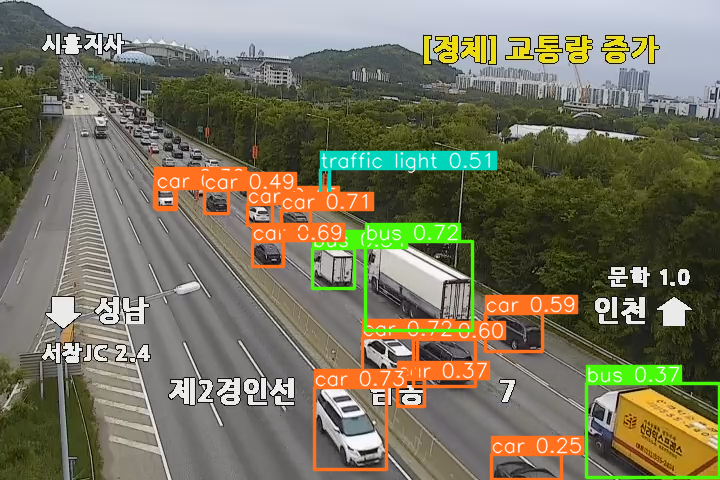

In [3]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8n.pt") 

# Use the model to detect object
image = r"E:\videoframe_25515.png"
result_predict = model.predict(source = image, imgsz=(416))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))


image 1/1 C:\Users\ime203\Desktop\Graduation\Train\BC2000201\20201022_015957_S_9500.jpg: 256x416 (no detections), 250.0ms
Speed: 2.0ms preprocess, 250.0ms inference, 33.6ms postprocess per image at shape (1, 3, 256, 416)


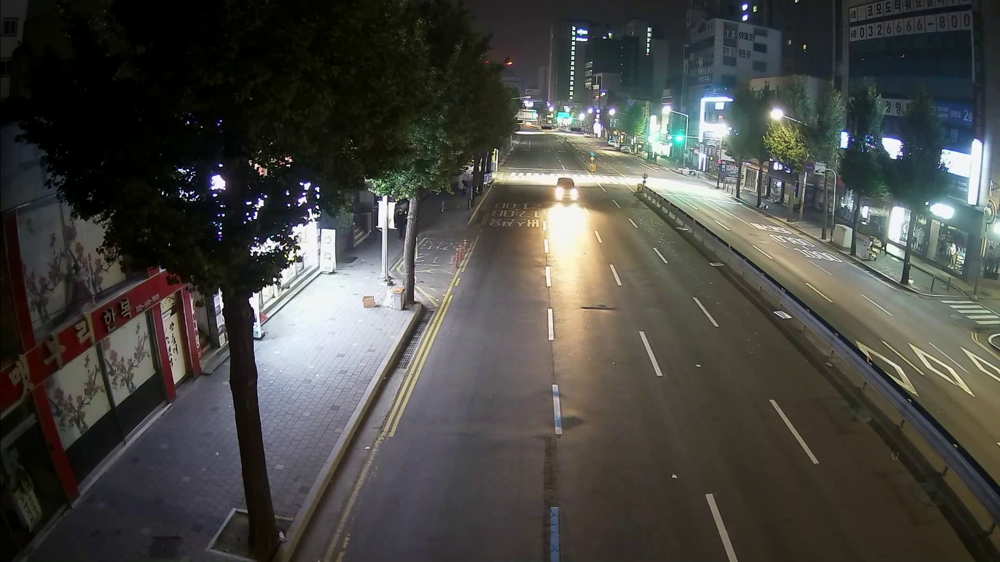


image 1/1 C:\Users\ime203\Desktop\Graduation\Train\BC2000201\20201020_015957_S_8811.jpg: 256x416 (no detections), 19.0ms
Speed: 0.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 416)


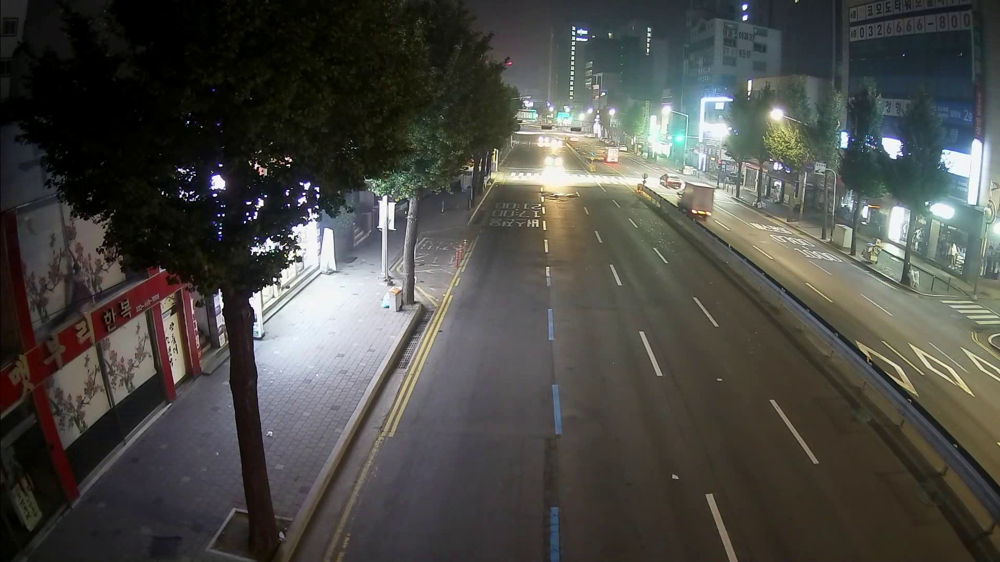


image 1/1 C:\Users\ime203\Desktop\Graduation\Train\BC2000201\20201018_055956_S_11979.jpg: 256x416 1 car, 11.4ms
Speed: 0.9ms preprocess, 11.4ms inference, 163.6ms postprocess per image at shape (1, 3, 256, 416)


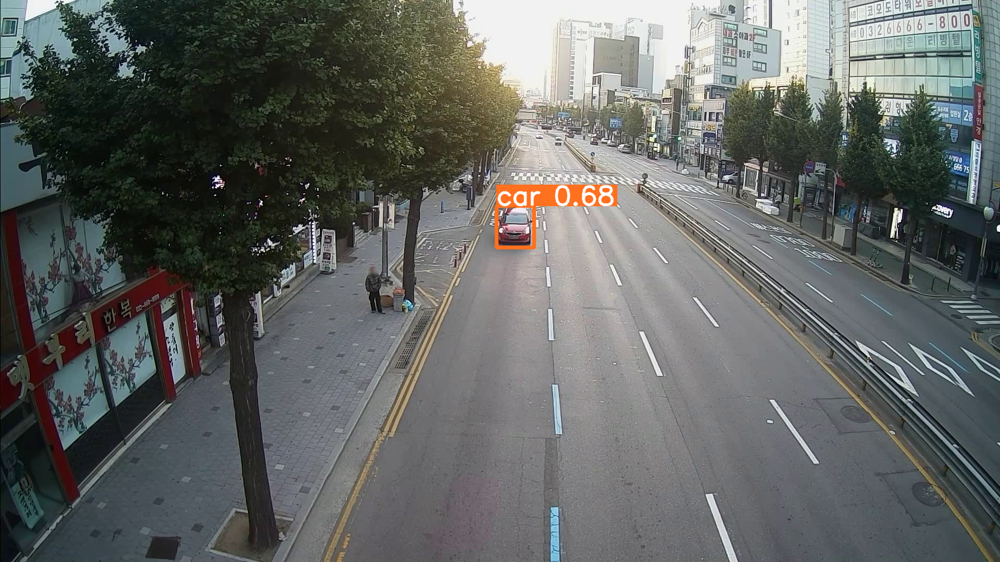

In [6]:
import os
import random
import matplotlib.pyplot as plt
import cv2

# YOLO 모델 로드
model = YOLO('yolov8n.pt')

# 데이터셋 경로 설정
Image_dir = r"C:\Users\ime203\Desktop\Graduation\Train\BC2000201"

# 무작위로 선택한 이미지의 수
num_images = 3

# 선택한 수만큼 이미지를 반복하여 처리
for _ in range(num_images):
    # 랜덤하게 이미지 선택
    rand_media = random.choice(os.listdir(Image_dir))

    # 이미지 경로
    image_path = os.path.join(Image_dir, rand_media)

    # 이미지 로드 및 객체 검출
    result_predict = model.predict(source=image_path, imgsz=(416, 416))

      # show results
    plot = result_predict[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))


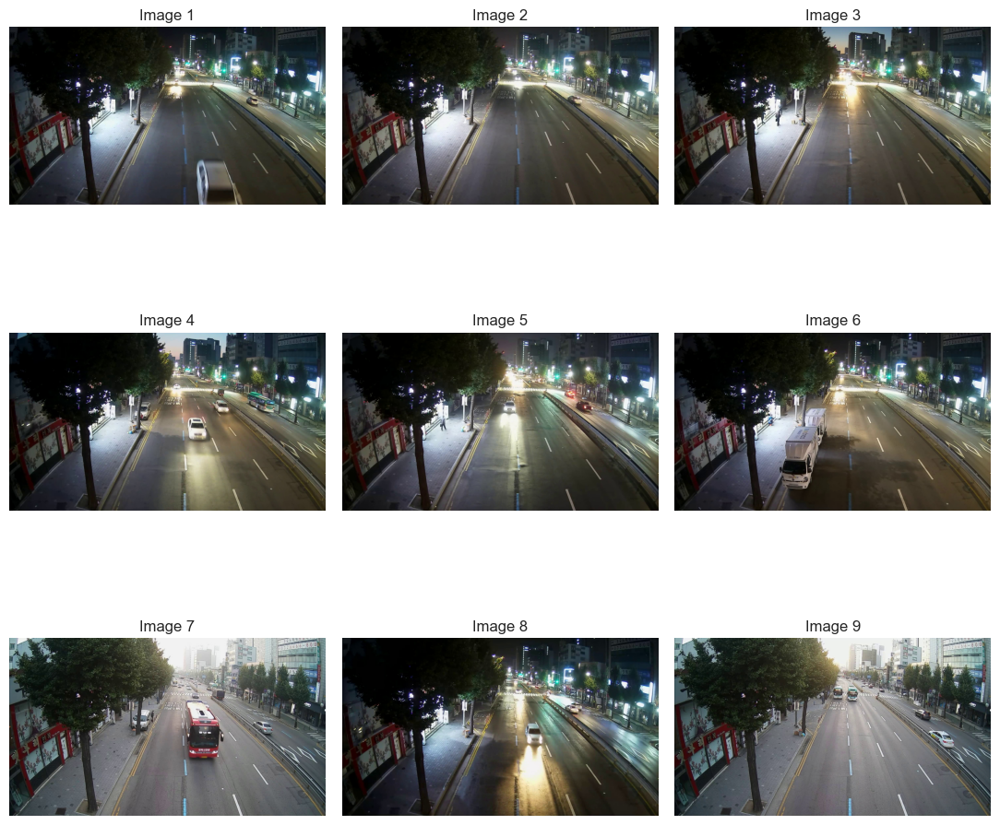

In [4]:
Image_dir = r"C:\Users\ime203\Desktop\Graduation\Train\BC2000201"

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

***3.1.2. Get Shape Of An Image For Using In Training Step***

File 1: 20201020_055956_S_8500.jpg - The image has dimensions 1920x1080 and 3 channels.
File 2: 20201020_015957_S_9603.jpg - The image has dimensions 1920x1080 and 3 channels.
File 3: 20201022_115958_S_6039.jpg - The image has dimensions 1920x1080 and 3 channels.
File 4: 20201022_055958_S_8600.jpg - The image has dimensions 1920x1080 and 3 channels.
File 5: 20201022_175959_S_1100.jpg - The image has dimensions 1920x1080 and 3 channels.
File 6: 20201017_065957_S_1188.jpg - The image has dimensions 1920x1080 and 3 channels.
File 7: 20201014_070001_S_495.jpg - The image has dimensions 1920x1080 and 3 channels.
File 8: 20201022_055958_S_11500.jpg - The image has dimensions 1920x1080 and 3 channels.
File 9: 20201017_185958_S_7200.jpg - The image has dimensions 1920x1080 and 3 channels.


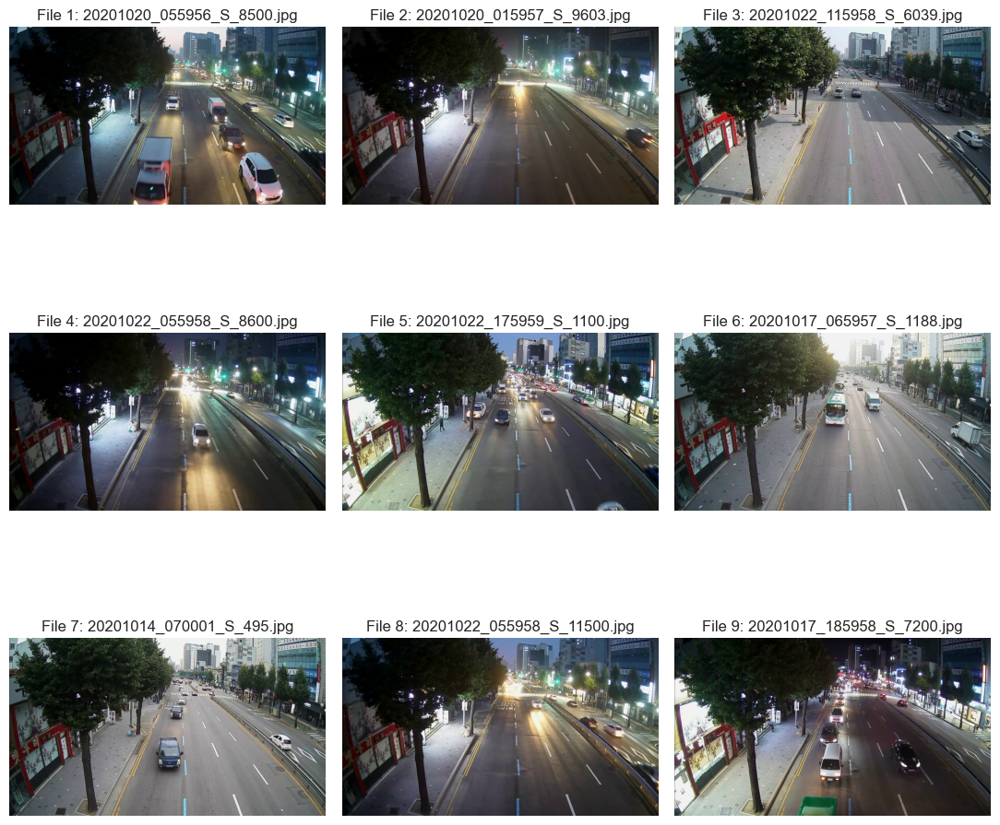

In [5]:
import os
import random
import matplotlib.pyplot as plt
import cv2  # 영상 처리를 위해 사용

# 데이터셋 경로 설정
Image_dir = r'C:\Users\ime203\Desktop\Graduation\Train\BC2000201'  # AI Hub에서 제공받은 데이터셋 경로로 변경

num_samples = 9
# 이미지와 비디오 파일 필터링
media_files = [f for f in os.listdir(Image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.mp4', '.avi'))]

# 랜덤으로 num_samples 개수만큼 미디어 파일 선택
rand_media = random.sample(media_files, num_samples)

# 시각화
fig, axes = plt.subplots(3, 3, figsize=(11, 11))  # 플롯 크기 조절 가능

for i, media in enumerate(rand_media):
    ax = axes[i // 3, i % 3]
    file_path = os.path.join(Image_dir, media)

    if media.endswith(('.mp4', '.avi')):  # 영상 파일인 경우
        video = cv2.VideoCapture(file_path)
        success, frame = video.read()
        if success:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # BGR에서 RGB로 변환
        video.release()
    else:  # 이미지 파일인 경우
        frame = plt.imread(file_path)

    # 이미지 또는 영상 프레임의 크기와 채널 정보 가져오기
    if frame is not None:
        h, w, c = frame.shape
        print(f'File {i+1}: {media} - The image has dimensions {w}x{h} and {c} channels.')

    ax.imshow(frame)
    ax.set_title(f'File {i+1}: {media}')
    ax.axis('off')

plt.tight_layout()
plt.show()

## <b>4 <span style='color:#e61227'>|</span> Try Pre-trained YOLOv8 For Detect Traffic Signs  </b>

## <b>5 <span style='color:#e61227'>|</span> YOLOv8-Based Traffic Signs Detection Model</b>
<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227''>5.1 |</span></b> Model Training Using Customized Dataset Of Traffic Signs </b></p>
</div>
        
***Mean Average Precision (mAP)*** is a metric used to evaluate the effectiveness of object detection algorithms in identifying and locating objects within images. It takes into account both precision and recall across different categories. By calculating the Average Precision (AP) for each category and taking the average, mAP provides an overall assessment of the algorithm's performance.

If the obtained mAP after the final epoch is not satisfactory, there are several options available to improve the results:
- Extending the training process by increasing the number of **epochs**: Training for more epochs allows the model to learn more patterns and potentially improve its performance. You can specify a higher value for the --epochs argument when running the training command.
- Experimenting with different **parameter values**: You can try adjusting various parameters to see if they have a positive impact on the results. Some parameters to consider are:
- **Batch Size:** Changing the batch size can affect the convergence and generalization of the model. You can modify the --batch-size argument to find an optimal value.
- **Initial Learning Rate (lr0)**: The initial learning rate determines the step size at the beginning of the training process. You can tune the --lr0 parameter to control how quickly the model learns.
- **Learning Rate Range (lrf)**: The learning rate range determines the range of learning rates used during the training. Experimenting with different values for --lrf can help find a better learning rate schedule.
- **Selecting a different optimizer**: The optimizer is responsible for updating the model's parameters based on the calculated gradients. Changing the optimizer can sometimes lead to better convergence and results. Ultralytics YOLOv8 supports different optimizers such as SGD, Adam, and RMSprop. You can try using a different optimizer by modifying the --optimizer argument.

For more details on resuming interrupted trainings and additional training options, you can refer to the Ultralytics YOLOv8 documentation.
        
In order to optimize the performance of the model, we have conducted experiments with different parameter values and optimizers. During the training phase, I explored various combinations of epochs, batch sizes, initial learning rates (lr0), and dropout values. The following values were used for experimentation:

- Epochs: ***10***, ***50***, ***100***
- Batch sizes: ***8***, ***16***, ***32***, ***64***
- Initial learning rates (lr0): ***0.001***, ***0.0003***, ***0.0001***
- Dropout: ***0.15***, ***0.25***

Furthermore, we have evaluated the model's performance using different optimizers, including **Adam**, **SGD**, and **auto**. By employing these optimizers, we aimed to assess their impact on the model's convergence and overall results.

After rigorous experimentation and training, we are pleased to present the results of our findings. The performance of the YOLOv8 model was assessed based on various metrics, including Mean Average Precision (mAP).


***5.1.1. Training Step***

In [6]:
import yaml

extract_dir = r"E:\YOLO"

# data.yaml 파일 경로
data_yaml_path = os.path.join(extract_dir, 'data.yaml')

# data.yaml 파일 내용 확인
with open(data_yaml_path, 'r') as file:
    data_config = yaml.safe_load(file)

print(data_config)


{'train': '../train/images', 'val': '../valid/images', 'nc': 4, 'names': ['Bicycle', 'Car', 'Motorcycle', 'Person'], 'roboflow': {'workspace': 'hankuk-university-of-foregin-studies-wxocc', 'project': 'traffic-classification-53urf', 'version': 1, 'license': 'Public Domain', 'url': 'https://universe.roboflow.com/hankuk-university-of-foregin-studies-wxocc/traffic-classification-53urf/dataset/1'}}


In [7]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8n.pt") 

# 학습 설정
model1 = model.train(
    data=r"E:\YOLO\data.yaml",  # data.yaml 파일 경로
    epochs=80,
    imgsz=416,
    batch=16,
    lr0=0.001,
    dropout=0.15,
    device= 0,  # GPU 인덱스, CPU를 사용할 경우 'cpu'로 설정
    name = 'Epochs80test'
)

New https://pypi.org/project/ultralytics/8.2.20 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.18  Python-3.9.13 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 10240MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=E:\YOLO\data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=Epochs80test, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

train: Scanning E:\YOLO\train\labels.cache... 5408 images, 287 backgrounds, 0 corrupt: 100%|██████████| 5408/5408 [00:0
val: Scanning E:\YOLO\valid\labels.cache... 2318 images, 102 backgrounds, 0 corrupt: 100%|██████████| 2318/2318 [00:00<


Plotting labels to runs\detect\Epochs80test\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to runs\detect\Epochs80test
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      1.25G      1.355      1.808      1.111        106        416: 100%|██████████| 338/338 [01:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:10


                   all       2318      10597      0.795      0.217      0.248      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      1.14G      1.301       1.33      1.099         86        416: 100%|██████████| 338/338 [00:30<00:00, 1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:11


                   all       2318      10597      0.581      0.241      0.261      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      1.13G      1.305      1.266      1.102         92        416: 100%|██████████| 338/338 [00:43<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:14


                   all       2318      10597      0.782      0.243      0.277      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      1.13G      1.291      1.207      1.103         82        416: 100%|██████████| 338/338 [00:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.634      0.324      0.332      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80      1.13G      1.241      1.129       1.08        155        416: 100%|██████████| 338/338 [00:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:14


                   all       2318      10597      0.663      0.293       0.32      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      1.12G      1.213      1.097      1.072        105        416: 100%|██████████| 338/338 [00:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:14


                   all       2318      10597      0.617      0.322      0.321      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      1.13G      1.186      1.058       1.06         85        416: 100%|██████████| 338/338 [00:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:15


                   all       2318      10597      0.603      0.351      0.338      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80      1.13G      1.182      1.055      1.059        120        416: 100%|██████████| 338/338 [00:44<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:15


                   all       2318      10597      0.383      0.328      0.341       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      1.13G      1.152      1.032      1.047        150        416: 100%|██████████| 338/338 [00:43<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:15


                   all       2318      10597       0.46      0.349      0.384      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      1.13G      1.131      1.004      1.039         76        416: 100%|██████████| 338/338 [00:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.437      0.402      0.385      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      1.12G      1.123      0.993      1.034        123        416: 100%|██████████| 338/338 [00:31<00:00, 1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:17


                   all       2318      10597      0.676       0.35      0.389      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      1.13G      1.112     0.9724       1.03        109        416: 100%|██████████| 338/338 [00:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:16


                   all       2318      10597      0.381      0.408      0.408      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      1.12G      1.115     0.9656      1.029        159        416: 100%|██████████| 338/338 [00:48<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.408      0.469      0.427       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80      1.12G      1.103     0.9694      1.024         80        416: 100%|██████████| 338/338 [00:50<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.474      0.454      0.422      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      1.12G       1.09     0.9433      1.018        107        416: 100%|██████████| 338/338 [00:48<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.462      0.458      0.438      0.262

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      1.12G      1.089     0.9364      1.017        115        416: 100%|██████████| 338/338 [00:48<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597       0.44      0.469      0.446       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      1.12G      1.073     0.9246      1.015        123        416: 100%|██████████| 338/338 [00:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.497      0.385      0.452       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80      1.12G      1.065     0.9176      1.007        114        416: 100%|██████████| 338/338 [00:48<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.544      0.477      0.457      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      1.12G      1.057     0.9019      1.006         94        416: 100%|██████████| 338/338 [00:49<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.493      0.512      0.463      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      1.12G      1.034     0.8989      1.003         80        416: 100%|██████████| 338/338 [00:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:19


                   all       2318      10597      0.504      0.505      0.468      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      1.12G      1.047     0.8906      1.002        128        416: 100%|██████████| 338/338 [00:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.492      0.512      0.466      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      1.12G      1.022     0.8717      0.992        121        416: 100%|██████████| 338/338 [00:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.542      0.456      0.461      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80      1.12G      1.033     0.8664     0.9933         98        416: 100%|██████████| 338/338 [00:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.469      0.515      0.462      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      1.12G      1.023      0.863      0.994         72        416: 100%|██████████| 338/338 [00:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.533      0.405      0.475      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      1.12G       1.02     0.8562      0.992         81        416: 100%|██████████| 338/338 [00:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.507      0.511      0.489        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      1.12G      1.008      0.846     0.9895        133        416: 100%|██████████| 338/338 [00:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.517      0.548      0.487      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      1.12G      1.011     0.8504     0.9915        120        416: 100%|██████████| 338/338 [00:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.546      0.503      0.497      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80      1.12G      0.995     0.8357     0.9872        126        416: 100%|██████████| 338/338 [00:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.566      0.482      0.491      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      1.12G     0.9883     0.8258     0.9827         75        416: 100%|██████████| 338/338 [00:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:19


                   all       2318      10597      0.587      0.474      0.494      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      1.12G     0.9917     0.8285     0.9812        120        416: 100%|██████████| 338/338 [00:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.568      0.542      0.506      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      1.12G     0.9943     0.8261     0.9828        166        416: 100%|██████████| 338/338 [00:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.528      0.545      0.509       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      1.12G     0.9755     0.8203      0.977        117        416: 100%|██████████| 338/338 [00:44<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.586      0.475       0.51      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80      1.12G     0.9822     0.8145     0.9776        119        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.543      0.516      0.509      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80      1.12G     0.9764     0.8113     0.9726        102        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.558      0.569      0.525      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80      1.12G     0.9666     0.7916     0.9727        109        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.507      0.553      0.497       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      1.12G     0.9604     0.7922     0.9704        141        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.512      0.523      0.493      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80      1.12G     0.9539     0.7855     0.9676         88        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.591      0.516      0.525      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80      1.12G     0.9547     0.7812     0.9683        106        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.543      0.556      0.533      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      1.12G     0.9435     0.7768     0.9619        118        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.565      0.557      0.534      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80      1.12G       0.95     0.7796     0.9625         93        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.548      0.518      0.518      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80      1.12G     0.9388     0.7693     0.9636        106        416: 100%|██████████| 338/338 [00:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:18


                   all       2318      10597      0.603      0.551      0.547      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80      1.12G     0.9381     0.7615      0.959         99        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.573      0.523      0.529      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      1.12G     0.9373     0.7645     0.9607         97        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.589      0.526      0.521      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      1.12G     0.9258     0.7546     0.9582         98        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.522      0.555      0.513       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      1.12G     0.9255      0.752     0.9571        113        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.604      0.579      0.555      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      1.12G     0.9221     0.7547     0.9568        107        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.617      0.519      0.547       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80      1.12G     0.9271     0.7467     0.9576        121        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.583      0.593       0.56      0.355

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      1.12G     0.9147     0.7407     0.9522         93        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597       0.58      0.571      0.535      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80      1.12G     0.9091     0.7331     0.9486        144        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.581      0.568      0.546      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      1.12G     0.9091     0.7372     0.9503        126        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.594      0.569      0.551      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80      1.12G     0.8996     0.7272     0.9493        123        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.567      0.579      0.545      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      1.12G      0.904      0.722     0.9481        125        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.643      0.566      0.582      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80      1.12G     0.8955     0.7244     0.9468         83        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.583      0.564      0.539      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      1.12G     0.8904     0.7124     0.9406        109        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.609        0.6      0.573      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80      1.12G      0.893     0.7178     0.9422         91        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.626      0.573       0.57      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80      1.12G      0.889     0.7173     0.9442         71        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.572      0.596      0.568      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80      1.12G     0.8813     0.7102     0.9411        143        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.594      0.609       0.57      0.371

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80      1.12G     0.8768        0.7     0.9395        102        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.578      0.568      0.556      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80      1.12G     0.8732     0.6931     0.9397         90        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.605       0.55      0.549      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80      1.12G     0.8778     0.6976     0.9372         77        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.595      0.561      0.553      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      1.12G     0.8761     0.6994     0.9383        116        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.575      0.615      0.562       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80      1.12G      0.864     0.6872     0.9338        104        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.584      0.578      0.569      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      1.12G     0.8629     0.6901      0.935        125        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.599      0.626      0.573      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80      1.12G     0.8659     0.6845     0.9339        110        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.645        0.6      0.588      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80      1.12G     0.8604     0.6799     0.9331         93        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597       0.63      0.607      0.575      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      1.12G     0.8488     0.6749     0.9261        143        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.647      0.559      0.574      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80      1.12G     0.8563     0.6665     0.9339        134        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.619      0.613      0.583      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80      1.12G     0.8564      0.679      0.932        102        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.605      0.622      0.578      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80      1.12G     0.8518     0.6702     0.9348        115        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.625      0.603      0.575      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      1.12G     0.8425     0.6656     0.9278         98        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.604      0.595      0.582      0.392


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      1.12G     0.7878     0.6023     0.9042         52        416: 100%|██████████| 338/338 [00:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597       0.62      0.591      0.588      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      1.12G     0.7802     0.5921     0.8979         70        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13


                   all       2318      10597      0.624      0.614      0.595      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      1.12G     0.7776     0.5874     0.8995         60        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597       0.63      0.595        0.6      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      1.12G     0.7721     0.5834     0.8979         80        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.645      0.602      0.602      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      1.12G     0.7683     0.5785     0.8949         87        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.655       0.61       0.61       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      1.12G     0.7665     0.5739     0.8976         69        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.647      0.605      0.607      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      1.12G      0.759     0.5704      0.893         72        416: 100%|██████████| 338/338 [00:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597       0.63      0.621      0.603      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      1.12G     0.7605     0.5674     0.8939         61        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597       0.64      0.604      0.602      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      1.12G     0.7591     0.5623     0.8926         85        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.639      0.584      0.601       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80      1.12G     0.7552     0.5666     0.8898         79        416: 100%|██████████| 338/338 [00:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:13

                   all       2318      10597      0.669      0.567      0.599      0.407



80 epochs completed in 1.253 hours.
Optimizer stripped from runs\detect\Epochs80test\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\Epochs80test\weights\best.pt, 6.2MB

Validating runs\detect\Epochs80test\weights\best.pt...
Ultralytics YOLOv8.2.18  Python-3.9.13 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 10240MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:16


                   all       2318      10597      0.656      0.609      0.611       0.41
               Bicycle       2318         50      0.543       0.48      0.453      0.254
                   Car       2318       8187      0.807      0.817      0.867      0.688
            Motorcycle       2318        125      0.561      0.561      0.497      0.311
                Person       2318       2235      0.712      0.579      0.626      0.386
Speed: 0.3ms preprocess, 0.8ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs\detect\Epochs80test


***5.1.2. Validation Step***

In [8]:
list_of_metrics = ["P_curve.png","R_curve.png","confusion_matrix.png"]

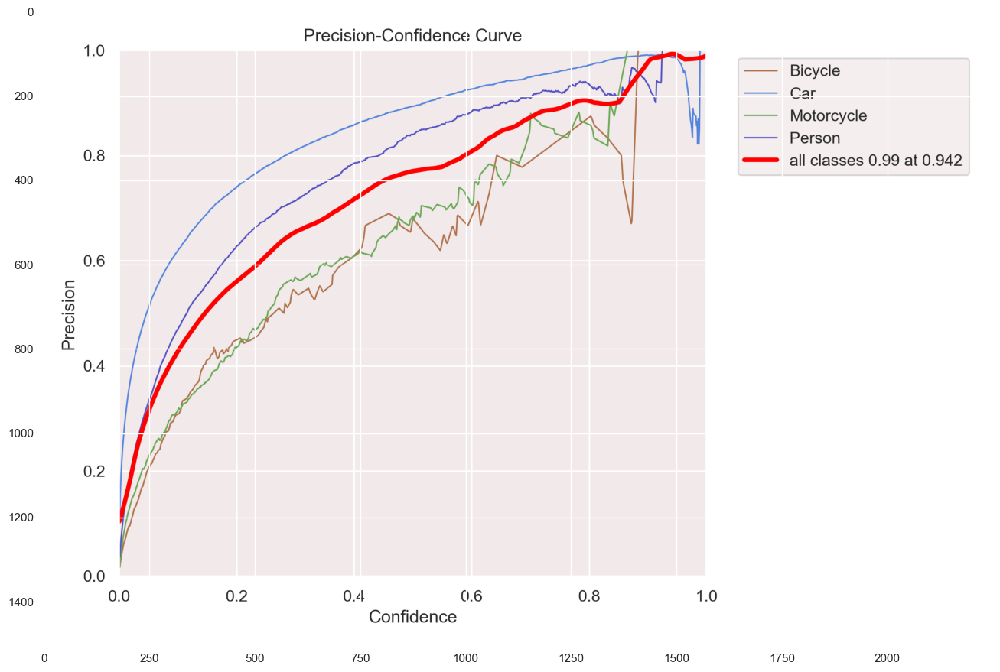

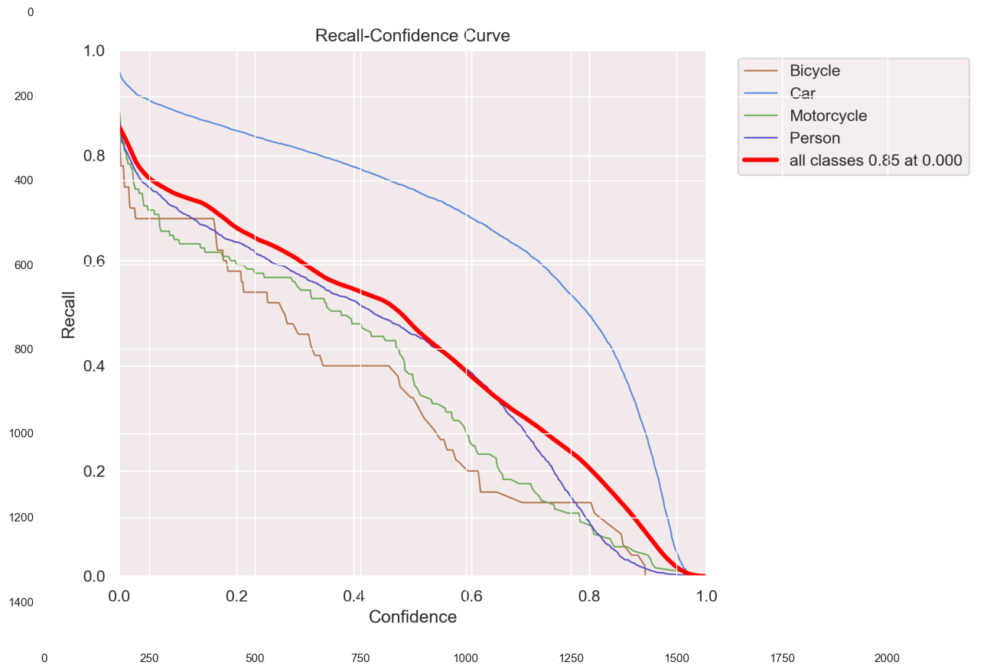

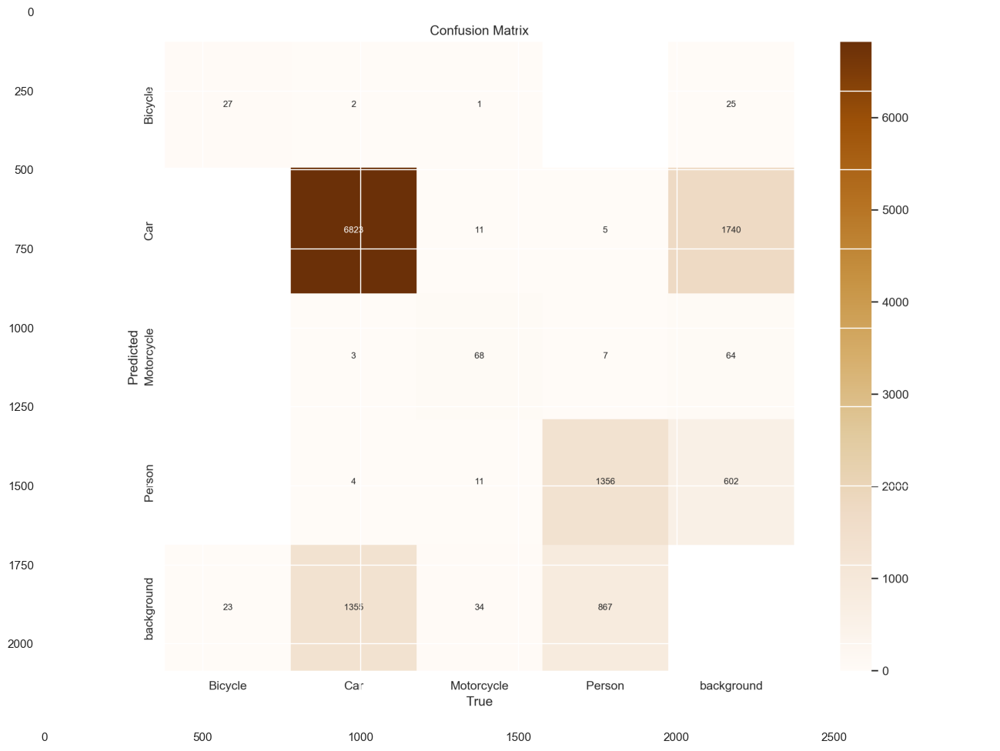

In [9]:
# Load the image
for i in list_of_metrics:
    image = cv2.imread(f'runs/detect/Epochs80test/{i}')

    # Create a larger figure
    plt.figure(figsize=(16, 12))

    # Display the image
    plt.imshow(image)

    # Show the plot
    plt.show()

In [10]:
# Load the CSV file
result_path = r"C:\Users\ime203\Desktop\Graduation\runs\detect\Epochs80test\results.csv"  # 결과 CSV 파일의 경로로 수정해야 합니다
Result_Final_model = pd.read_csv(result_path)

# Display the last 10 rows
Result_Final_model.tail(10)

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
70,71,0.78777,0.60230,0.90422,0.62001,0.59096,0.58787,0.39453,0.80505,0.64938,0.91445,0.000167,0.000167,0.000167
71,72,0.78017,0.59206,0.89786,0.62417,0.61432,0.59541,0.39935,0.80138,0.64570,0.91366,0.000152,0.000152,0.000152
72,73,0.77760,0.58740,0.89946,0.62973,0.59483,0.59984,0.40252,0.79933,0.64429,0.91239,0.000136,0.000136,0.000136
73,74,0.77208,0.58344,0.89789,0.64505,0.60153,0.60176,0.40550,0.79836,0.64224,0.91309,0.000121,0.000121,0.000121
74,75,0.76826,0.57848,0.89486,0.65480,0.61003,0.61050,0.40961,0.79561,0.64109,0.91264,0.000105,0.000105,0.000105
75,76,0.76647,0.57392,0.89756,0.64701,0.60489,0.60667,0.40856,0.79364,0.63936,0.91129,0.000090,0.000090,0.000090
76,77,0.75896,0.57036,0.89304,0.63022,0.62095,0.60316,0.40737,0.79294,0.64054,0.91145,0.000074,0.000074,0.000074
77,78,0.76050,0.56739,0.89392,0.64006,0.60383,0.60163,0.40866,0.79089,0.63967,0.91070,0.000059,0.000059,0.000059
78,79,0.75915,0.56228,0.89263,0.63873,0.58393,0.60096,0.41005,0.79103,0.63911,0.90994,0.000043,0.000043,0.000043
79,80,0.75523,0.56662,0.88983,0.66878,0.56687,0.59877,0.40722,0.78948,0.63793,0.90904,0.000028,0.000028,0.000028


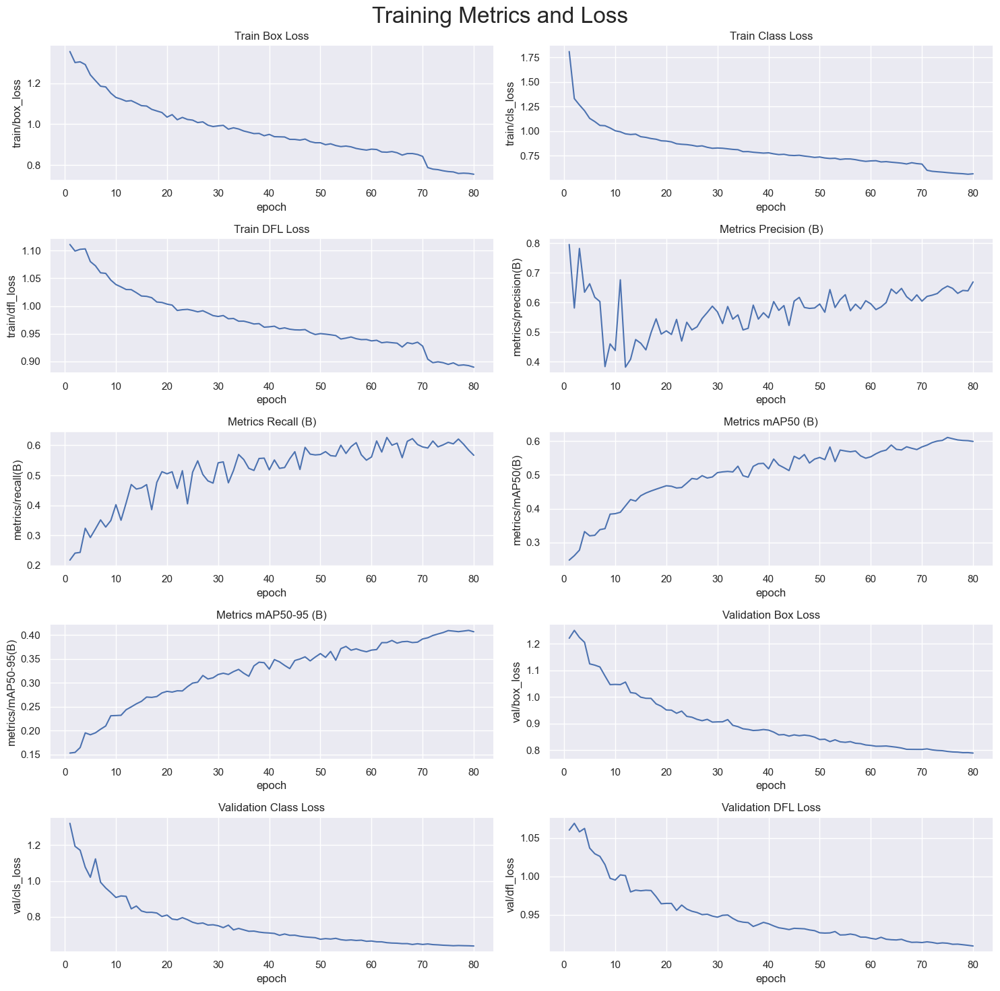

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 결과를 Google 드라이브로부터 불러오기
Result_Final_model = pd.read_csv(r"C:\Users\ime203\Desktop\Graduation\runs\detect\Epochs80test\results.csv")

# 결과 데이터프레임의 컬럼명 공백 제거
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227''>5.2 |</span></b> Validation of the Model By TestSet </b></p>
</div>

#### Test Dataset이 없으므로 생략

In [54]:
#from ultralytics import YOLO

# Loading the best performing model
#Valid_model = YOLO(r"C:\Users\ime203\Desktop\Graduation\runs\detect\batch16_epochs30_prototype\weights\best.pt")

# Evaluating the model on the testset
#metrics = Valid_model.val(split = 'test')

Ultralytics YOLOv8.2.18  Python-3.9.13 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 10240MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


FileNotFoundError: [34m[1mval: [0mError loading data from None
See https://docs.ultralytics.com/datasets/detect for dataset formatting guidance.

In [ ]:
# Compute F1 Score
precision = metrics.results_dict["metrics/precision(B)"]
recall = metrics.results_dict["metrics/recall(B)"]
f1_score = 2 * (precision * recall) / (precision + recall)
print("F1 Score: ", f1_score)

# Load the confusion matrix
confusion_matrix_path = r"C:\Users\ime203\Desktop\Graduation\runs\detect\batch16_epochs30_prototype\confusion_matrix.png"  # 수정 필요
confusion_matrix_image = cv2.imread(confusion_matrix_path)

# Display the confusion matrix
plt.figure(figsize=(8, 8))
plt.imshow(confusion_matrix_image)
plt.axis('off')
plt.title('Confusion Matrix')
plt.show()

**Tip: Based on the observed results, it is evident that the accuracy of the model on both the validation and test data sets exhibits a high degree of similarity. This outcome serves as an indication that the model has been appropriately trained.**

<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227''>5.3 |</span></b> Making Predictions On Test Images </b></p>
</div>

In [12]:
import os
import random
import cv2


# Path to the directory containing the images
image_dir = r"C:\Users\ime203\Desktop\Graduation\Sample\Images\Test_mini" # 수정 필요


# Get a list of all image files in the directory
image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')]

# Randomly select 10 images from the directory
random_images = random.sample(image_files, k=10)

for image_path in random_images:
    image = cv2.imread(image_path)  # Replace with your preferred method of reading the image
    results = model1.predict([image], save=True, imgsz=416, conf=0.5, iou=0.7)
    #results.append(results)


0: 256x416 (no detections), 156.3ms
Speed: 0.0ms preprocess, 156.3ms inference, 0.0ms postprocess per image at shape (1, 3, 256, 416)
Results saved to runs\detect\Epochs80test2

0: 256x416 4 Cars, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 256, 416)
Results saved to runs\detect\Epochs80test3

0: 256x416 3 Cars, 5.9ms
Speed: 3.0ms preprocess, 5.9ms inference, 13.3ms postprocess per image at shape (1, 3, 256, 416)
Results saved to runs\detect\Epochs80test4

0: 256x416 3 Cars, 11.0ms
Speed: 1.9ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 416)
Results saved to runs\detect\Epochs80test5

0: 256x416 1 Car, 19.3ms
Speed: 0.0ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 256, 416)
Results saved to runs\detect\Epochs80test6

0: 256x416 4 Cars, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 14.6ms postprocess per image at shape (1, 3, 256, 416)
Results saved to runs\detect\Ep

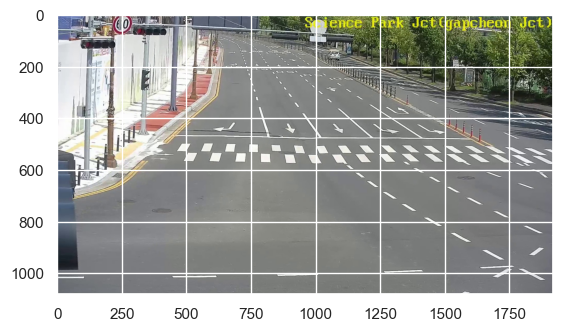

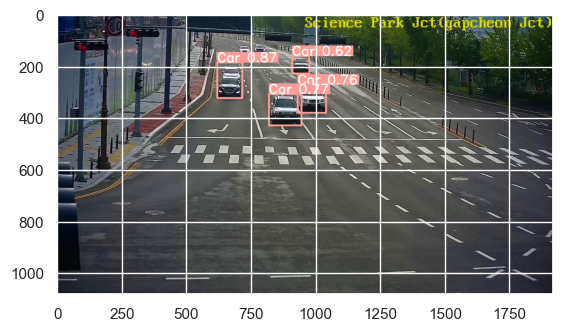

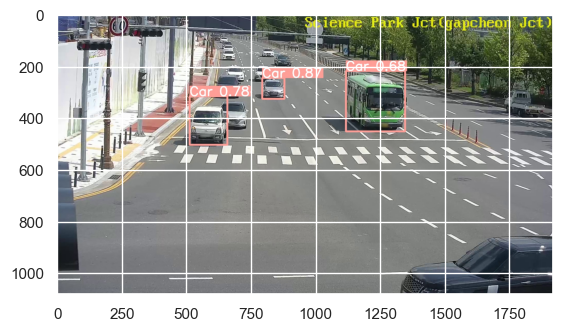

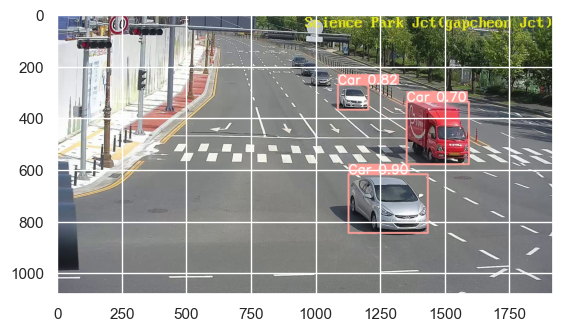

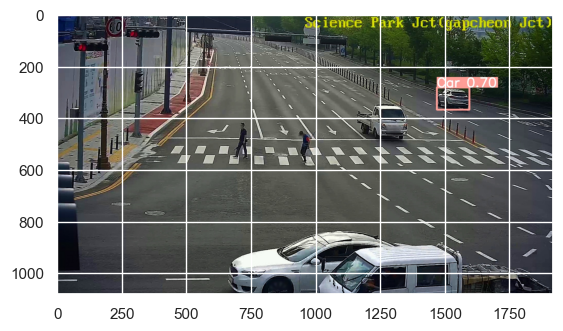

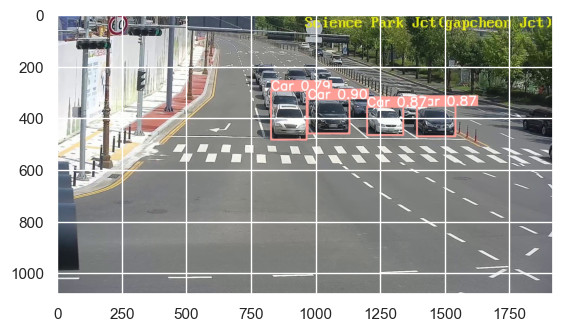

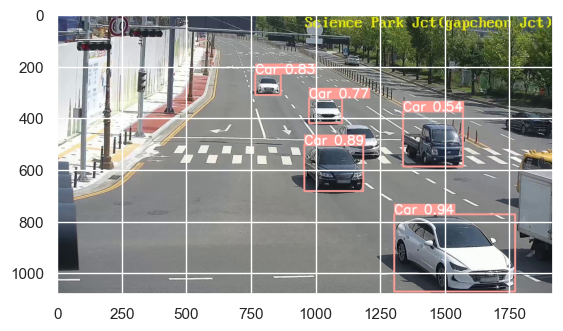

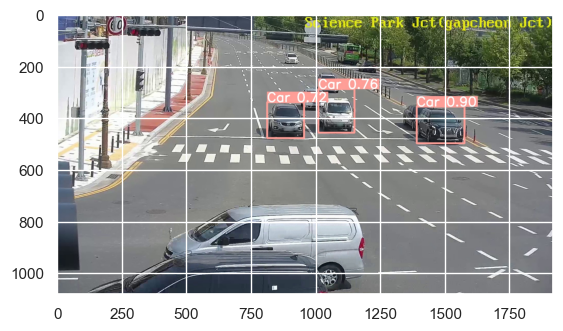

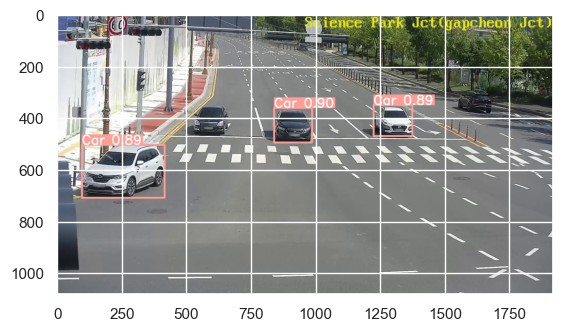

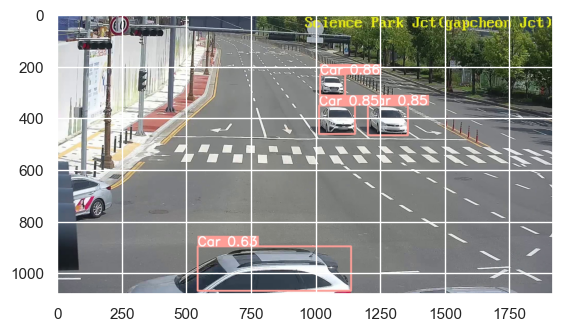

In [13]:

# View results
for i in range(2,12):
    plt.imshow(plt.imread(f'C:/Users/ime203/Desktop/Graduation/runs/detect/Epochs80test{i}/image0.jpg'))
    plt.show()

## <b>6 <span style='color:#e61227'>|</span> Try Pre-trained YOLOv8 For Detect Traffic Signs From Video  </b>
<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227'>6.1 |</span></b> Show Original Video Before Detect </b></p>
</div>

**Tip: Due to the substantial volume of the video generated from the image dataset, I have to utilize only a truncated segment of the original video for this project.**

In [17]:
video_model = YOLO(r"C:\Users\ime203\Desktop\Graduation\runs\detect\Epochs50test\weights\best.pt")

video_model.predict(source=r"E:\Kangnam.mp4", show=True, save = True)



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/916) E:\Kangnam.mp4: 288x416 3 Cars, 1 Person, 156.8ms
video 1/1 (frame 2/916) E:\Kangnam.mp4: 288x416 3 Cars, 32.2ms
video 1/1 (frame 3/916) E:\Kangnam.mp4: 288x416 2 Cars, 1 Person, 29.6ms
video 1/1 (frame 4/916) E:\Kangnam.mp4: 288x416 2 Cars, 27.9ms
video 1/1 (frame 5/916) E:\Kangnam.mp4: 288x416 2 Cars, 27.9ms
video 1/1 (frame 6/916) E:\Kangnam.mp4: 288x416 1 Car, 30.3ms
video 1/1 (frame 7/916) E:\Kangnam.mp4: 288x416 2 Cars, 29.0

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Bicycle', 1: 'Car', 2: 'Motorcycle', 3: 'Person'}
 obb: None
 orig_img: array([[[213, 171, 189],
         [213, 171, 189],
         [213, 171, 189],
         ...,
         [166, 159, 153],
         [166, 159, 153],
         [166, 159, 153]],
 
        [[213, 171, 189],
         [213, 171, 189],
         [213, 171, 189],
         ...,
         [156, 149, 143],
         [153, 146, 140],
         [153, 146, 140]],
 
        [[213, 171, 189],
         [213, 171, 189],
         [213, 171, 189],
         ...,
         [156, 149, 143],
         [153, 146, 140],
         [153, 146, 140]],
 
        ...,
 
        [[ 88,  83,  92],
         [ 88,  83,  92],
         [ 87,  82,  91],
         ...,
         [ 65,  56,  76],
         [ 62,  77,  85],
         [ 69,  84,  92]],
 
        [[ 85,  80,  89],
         [ 85,  80,  89],
         [ 84,  7

<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227'>7.2 |</span></b> Predict By Pr-Trained YOLOv8 </b></p>
</div>

In [ ]:
import os
from IPython.display import display, Image

# Function to display images and videos
def display_images_and_videos(image_dir, video_path):
    # Display images
    for filename in os.listdir(image_dir):
        if filename.endswith(".jpg"):
            display(Image(os.path.join(image_dir, filename)))

    # Display video
    if os.path.exists(video_path):
        display(Video(video_path))

# Use the model to detect signs
video_model.predict(source="/path/to/your/video.mp4", show=True, save=True)  # 비디오 경로 수정 필요

# Display images and videos with detected signs
display_images_and_videos(image_dir="/path/to/your/image/directory", video_path="/path/to/your/video.mp4")  # 이미지 디렉토리 및 비디오 경로 수정 필요

In [ ]:
from IPython.display import Video

# Convert format
!ffmpeg -y -loglevel panic -i /path/to/your/ai_hub_data/video.avi result_out.mp4

# Display the video
Video("result_out.mp4", width=960)